In [16]:
import os
import rasterio
import requests
from sentinelsat import SentinelAPI
#from skimage import io
import numpy as np
import glob
from rasterio.enums import Resampling
from rasterio.warp import reproject
from rasterio.mask import mask
from shapely.geometry import box
import xarray as xr
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import rasterio
import os
from osgeo import gdal
import leafmap
import rasterio.warp
import pyproj
import geopandas as gpd
from shapely.geometry import Polygon
import pandas as pd

In [17]:
def download_sentinel(products_df_sorted,output_dir='dervenoxwria'):
    if len(products_df_sorted) > 0:
        # Download the most recent image
        product_id = products_df_sorted.iloc[0]['uuid']
        product_info = api.get_product_odata(product_id)
        download_url = product_info['url']
        product_name = product_info['title']
        #output_dir = 'output_images'
        #os.makedirs(output_dir, exist_ok=True)
        output_path = os.path.join(output_dir, product_name)
        if os.path.exists(output_path):
            print(f"The image {product_name} is already downloaded.")
        else:
            api.download(product_id, output_path)

        # Unzip the downloaded file
        unzip_dir = os.path.join(output_dir, product_name, product_name+'.zip')

        try:
            #os.makedirs(unzip_dir, exist_ok=True)
            os.system(f'unzip {unzip_dir} -d {output_path}')
            os.remove(unzip_dir)
        except:
            print('zip has been deleted')
            print(unzip_dir)
        
        # Find the relevant image bands
        safe_dir = os.path.join(output_dir, product_name, f'{product_name}.SAFE')
        print('SAFE dir:',safe_dir)
        band8_path_pattern = os.path.join(safe_dir, 'GRANULE', '*', 'IMG_DATA', '*_B08.jp2')
        band12_path_pattern = os.path.join(safe_dir, 'GRANULE', '*', 'IMG_DATA', '*_B12.jp2')
        band4_path_pattern = os.path.join(safe_dir, 'GRANULE', '*', 'IMG_DATA', '*_B04.jp2')
        band3_path_pattern = os.path.join(safe_dir, 'GRANULE', '*', 'IMG_DATA', '*_B03.jp2')
        band2_path_pattern = os.path.join(safe_dir, 'GRANULE', '*', 'IMG_DATA', '*_B02.jp2')
        
        band8_path = glob.glob(band8_path_pattern)
        band12_path = glob.glob(band12_path_pattern)
        band4_path = glob.glob(band4_path_pattern)
        band3_path = glob.glob(band3_path_pattern)
        band2_path = glob.glob(band2_path_pattern)

    else:
        print('No Sentinel-2 images found within the specified bounding box and timeframe.')
    return(band8_path,band12_path,band4_path,band3_path,band2_path)

In [18]:
def create_nbr(band8_path,band12_path,bb):
    b8 = xr.open_dataset(band8_path,engine='rasterio')
    b12 = xr.open_dataset(band12_path)
    b12_resampled = b12.interp_like(b8,method='nearest')
#     b8_reprojected = b8.rio.reproject('epsg:4326')
#     b12_reprojected = b12_resampled.rio.reproject('epsg:4326')
    #b8_reprojected = b8_reprojected.sel(x=slice(bb[0],bb[2]), y = slice(bb[3],bb[1]))
    #b12_reprojected = b12_reprojected.sel(x=slice(bb[0],bb[2]), y = slice(bb[3],bb[1]))   
    #b8_reprojected = b8_reprojected.sel(x=slice(bb[0],bb[2]), y = slice(bb[3],bb[1]))
    #b12_reprojected = b12_reprojected.sel(x=slice(bb[0],bb[2]), y = slice(bb[3],bb[1]))
    #b8_reprojected = b8_reprojected.squeeze()
    #b12_reprojected = b12_reprojected.squeeze()
    nbr = (b8.band_data.values - b12_resampled.band_data.values)/(b8.band_data.values + b12_resampled.band_data.values)
    nbr = nbr.squeeze()
    nbr = xr.DataArray(nbr, coords={'x': b8['x'], 'y': b8['y']}, dims=['y', 'x'])
    nbr = nbr.squeeze()       
    #nbr_crop = nbr.sel(x=slice(bb[0],bb[2]), y = slice(bb[3],bb[1]))
    return(nbr)

In [19]:
def run_sentinel_dnbr(footprint,lat,lon,date='NOW',output_dir,raw_crs):
    if date == 'NOW':
        print('now')
        products = api.query(footprint, date=('NOW-7DAYS', 'NOW'), platformname='Sentinel-2',
                         processinglevel='Level-1C', cloudcoverpercentage=(0, 20))
    else:
        end_date = date
        end_date_obj = datetime.strptime(end_date, '%Y%m%d')
        start_date_obj = end_date_obj - timedelta(days=7)
        start_date = start_date_obj.strftime('%Y%m%d')
        products = api.query(footprint, date=(start_date, end_date), platformname='Sentinel-2',
                         processinglevel='Level-1C', cloudcoverpercentage=(0, 30))
    products_df = api.to_dataframe(products)
    products_df_sorted = products_df.sort_values('ingestiondate', ascending=False)
    tile = products_df_sorted.title.iloc[0].split('_')[5][1:]
    print('Tile:',tile)

    band8_path,band12_path,band4_path,band3_path,band2_path = download_sentinel(products_df_sorted,output_dir=output_dir)
    nbr_post = create_nbr(band8_path[0],band12_path[0],bb)
    nbr_post.to_netcdf(os.path.join(output_dir,'nbr_post.nc'))

    products = api.query(footprint, date=('NOW-40DAYS','NOW-10DAYS'), platformname='Sentinel-2',
                         processinglevel='Level-1C', cloudcoverpercentage=(0, 50))
    products_df = api.to_dataframe(products)
    products_df['tile'] = products_df.title.apply(lambda x: x.split('_')[5][1:])
    products_df = products_df[products_df.tile == tile]
    products_df_sorted = products_df.sort_values('ingestiondate', ascending=False)

    band8_path,band12_path,band4_path,band3_path,band2_path = download_sentinel(products_df_sorted,output_dir=output_dir)
    nbr_pre = create_nbr(band8_path[0],band12_path[0],bb)
    nbr_pre.to_netcdf(os.path.join(output_dir,'nbr_pre.nc'))
    dnbr = nbr_pre - nbr_post
    dnbr.rio.to_raster(os.path.join(output_dir,'dnbr.nc'))
    dnbr.rio.write_crs(raw_crs, inplace=True)
    dnbr_proj = dnbr.rio.reproject('epsg:4326')
    bb_crop = [lon-0.1, lat-0.1, lon+0.1, lat+0.1]
    print(bb_crop)
    dnbr_crop = dnbr_proj.sel(x=slice(bb_crop[0],bb_crop[2]), y = slice(bb_crop[3],bb_crop[1]))
    dnbr_crop.rio.to_raster(os.path.join(output_dir,'dnbr_crop.tif'))
    mask = dnbr_crop > 0.09
    result = dnbr_crop.where(mask)
    result = result.squeeze()
    result = xr.DataArray(result.values, coords={'x': result['x'], 'y': result['y']}, dims=['y', 'x'])
    result = result.to_dataset(name='burned')
    result.to_netcdf(os.path.join(output_dir,'burned.nc'))
    gdal_command = 'gdal_polygonize.py {} -b 1 {}'.format(os.path.join(output_dir,'burned.nc'),os.path.join(output_dir,'burned.shp'))
    os.system(gdal_command)
    polygon = gpd.read_file(os.path.join(output_dir,'burned.shp'))
    polygon = polygon.set_crs(4326)
    polygon = polygon.to_crs(2100)
    polygon = polygon.assign(area=polygon.area)
    print('Total Burned area: ',polygon.area.sum()/10000)
    polygon = polygon[polygon.area>25000]
    polygon_buffer = polygon.buffer(40, join_style=1).buffer(-40.0, join_style=1)
    polygon_buffer = polygon_buffer.simplify(tolerance=5)
    #smoothed_polygons = polygon['geometry'].simplify(tolerance=20) # Adjust the tolerance value as needed
    polygon_buffer.to_file((os.path.join(output_dir,'burned_smoothed_buffer40_simplify5.shp')))
    return polygon_buffer

In [20]:
lat, lon = 39.3595, 22.7987
output_dir='volos_{}_{}'.format(lat,lon)
raw_crs = 'epsg:32634'
date = 'NOW'

In [21]:
bb = [lon-0.001, lat-0.001, lon+0.001, lat+0.001]

In [22]:
footprint = f'POLYGON(({bb[0]} {bb[1]},{bb[2]} {bb[1]},' \
            f'{bb[2]} {bb[3]},{bb[0]} {bb[3]},' \
            f'{bb[0]} {bb[1]}))'

In [23]:
api = SentinelAPI('stelgirt', 'kamilia90', 'https://scihub.copernicus.eu/dhus')

In [ ]:
polygon = run_sentinel_dnbr(footprint,lat,lon,date=date,output_dir,raw_crs)

now
Tile: 34SFJ
The image S2A_MSIL1C_20230727T092031_N0509_R093_T34SFJ_20230727T130008 is already downloaded.
zip has been deleted
volos_39.3595_22.7987/S2A_MSIL1C_20230727T092031_N0509_R093_T34SFJ_20230727T130008/S2A_MSIL1C_20230727T092031_N0509_R093_T34SFJ_20230727T130008.zip
SAFE dir: volos_39.3595_22.7987/S2A_MSIL1C_20230727T092031_N0509_R093_T34SFJ_20230727T130008/S2A_MSIL1C_20230727T092031_N0509_R093_T34SFJ_20230727T130008.SAFE


unzip:  cannot find or open volos_39.3595_22.7987/S2A_MSIL1C_20230727T092031_N0509_R093_T34SFJ_20230727T130008/S2A_MSIL1C_20230727T092031_N0509_R093_T34SFJ_20230727T130008.zip, volos_39.3595_22.7987/S2A_MSIL1C_20230727T092031_N0509_R093_T34SFJ_20230727T130008/S2A_MSIL1C_20230727T092031_N0509_R093_T34SFJ_20230727T130008.zip.zip or volos_39.3595_22.7987/S2A_MSIL1C_20230727T092031_N0509_R093_T34SFJ_20230727T130008/S2A_MSIL1C_20230727T092031_N0509_R093_T34SFJ_20230727T130008.zip.ZIP.


The image S2A_MSIL1C_20230717T092031_N0509_R093_T34SFJ_20230717T130151 is already downloaded.
zip has been deleted
volos_39.3595_22.7987/S2A_MSIL1C_20230717T092031_N0509_R093_T34SFJ_20230717T130151/S2A_MSIL1C_20230717T092031_N0509_R093_T34SFJ_20230717T130151.zip
SAFE dir: volos_39.3595_22.7987/S2A_MSIL1C_20230717T092031_N0509_R093_T34SFJ_20230717T130151/S2A_MSIL1C_20230717T092031_N0509_R093_T34SFJ_20230717T130151.SAFE


unzip:  cannot find or open volos_39.3595_22.7987/S2A_MSIL1C_20230717T092031_N0509_R093_T34SFJ_20230717T130151/S2A_MSIL1C_20230717T092031_N0509_R093_T34SFJ_20230717T130151.zip, volos_39.3595_22.7987/S2A_MSIL1C_20230717T092031_N0509_R093_T34SFJ_20230717T130151/S2A_MSIL1C_20230717T092031_N0509_R093_T34SFJ_20230717T130151.zip.zip or volos_39.3595_22.7987/S2A_MSIL1C_20230717T092031_N0509_R093_T34SFJ_20230717T130151/S2A_MSIL1C_20230717T092031_N0509_R093_T34SFJ_20230717T130151.zip.ZIP.


[22.6987, 39.259499999999996, 22.8987, 39.4595]


Warning 1: No UNIDATA NC_GLOBAL:Conventions attribute


0...10...20...30...40...50...60...70...80...90...Creating output volos_39.3595_22.7987/burned.shp of format ESRI Shapefile.
100 - done.
Total Burned area:  5549.229913233644


# Apply thresholds

In [ ]:
# Flatten the temperature data for natural breaks analysis
dnbr_flattened = ds.dnbr_crop.values.flatten()

# Calculate the optimal number of bins using Fisher-Jenks optimization
num_bins = pysal.natural_breaks(dnbr_flattened, k=5)

# Create the temperature bins based on natural breaks
bins = pysal.Natural_Breaks(temperature_flattened, k=num_bins).bins

In [ ]:
# Group the dataset based on temperature bins
grouped_ds = dnbr_crop.groupby_bins('temperature', bins=bins, labels=False)

# Create rgb

In [162]:
safe_dir = '/home/sg/Projects/fires2023/rodos_smoke_34.871337_27.227918/S2B_MSIL1C_20230723T084609_N0509_R107_T35SNU_20230723T092729/S2B_MSIL1C_20230723T084609_N0509_R107_T35SNU_20230723T092729.SAFE'

In [182]:
output_dir= '/home/sg/Projects/fires2023/rodos_smoke_34.871337_27.227918/'

In [183]:
lat, lon = 39.765663, 22.532560
bb_crop = [lon-0.1, lat-0.1, lon+0.1, lat+0.1]

In [184]:
band4_path_pattern = os.path.join(safe_dir, 'GRANULE', '*', 'IMG_DATA', '*_B04.jp2')
band3_path_pattern = os.path.join(safe_dir, 'GRANULE', '*', 'IMG_DATA', '*_B03.jp2')
band2_path_pattern = os.path.join(safe_dir, 'GRANULE', '*', 'IMG_DATA', '*_B02.jp2')

band4_path = glob.glob(band4_path_pattern)[0]
band3_path = glob.glob(band3_path_pattern)[0]
band2_path = glob.glob(band2_path_pattern)[0]

In [185]:
band4 = xr.open_dataset(band4_path)
band3 = xr.open_dataset(band3_path)
band2 = xr.open_dataset(band2_path)

In [186]:
command = 'gdalbuildvrt -separate {}rgb.vrt {} {} {}'.format(output_dir, band4_path,band3_path,band2_path)

In [187]:
os.system(command)

0...10...20...30...40...50...60...70...80...90...100 - done.


0

In [188]:
command = 'gdal_translate {}rgb.vrt {}out.jpg'.format(output_dir,output_dir)

In [189]:
os.system(command)

Input file size is 10980, 10980
0...

Warning 1: One or more pixels clipped to fit 12bit domain for jpeg output.


10...20...30...40...50...60...70...80...90...100 - done.


0

In [190]:
command = 'gdal_merge.py -separate -o {}rgb_composite.tif {} {} {}'.format(output_dir, band4_path,band3_path,band2_path)

In [191]:
os.system(command)

0...10...20...30...40...50...60...70...80...90...100 - done.


0

# Create false color

In [16]:
safe_dir = '/home/sg/Projects/fires2023/rodos_a_36.207017_27.949507/S2B_MSIL1C_20230713T084649_N0509_R107_T35SNA_20230713T123203/S2B_MSIL1C_20230713T084649_N0509_R107_T35SNA_20230713T123203.SAFE'
output_dir= '/home/sg/Projects/fires2023/rodos_a_36.207017_27.949507/'

In [17]:
band12_path_pattern = os.path.join(safe_dir, 'GRANULE', '*', 'IMG_DATA', '*_B12.jp2')
band11_path_pattern = os.path.join(safe_dir, 'GRANULE', '*', 'IMG_DATA', '*_B11.jp2')
band4_path_pattern = os.path.join(safe_dir, 'GRANULE', '*', 'IMG_DATA', '*_B04.jp2')

band12_path = glob.glob(band12_path_pattern)[0]
band11_path = glob.glob(band11_path_pattern)[0]
band4_path = glob.glob(band4_path_pattern)[0]

In [18]:
band12 = xr.open_dataset(band12_path)
band11 = xr.open_dataset(band11_path)
band4 = xr.open_dataset(band4_path)

In [19]:
command = 'gdalbuildvrt -separate {}false_color_pre.vrt {} {} {}'.format(output_dir, band12_path,band11_path,band4_path)
os.system(command)
command = 'gdal_translate {}false_color_pre.vrt {}out_pre.jpg'.format(output_dir,output_dir)
os.system(command)
command = 'gdal_merge.py -separate -o {}false_color_composite_pre.tif {} {} {}'.format(output_dir, band12_path,band11_path,band4_path)
os.system(command)

0...10...20...30...40...50...60...70...80...90...100 - done.
Input file size is 6588, 6588
0

Warning 1: One or more pixels clipped to fit 12bit domain for jpeg output.


...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.


0

# comparison

In [20]:
img1 = '/home/sg/Projects/fires2023/rodos_pre.jpeg'
img2 = "/home/sg/Projects/fires2023/rodos_post.jpeg"


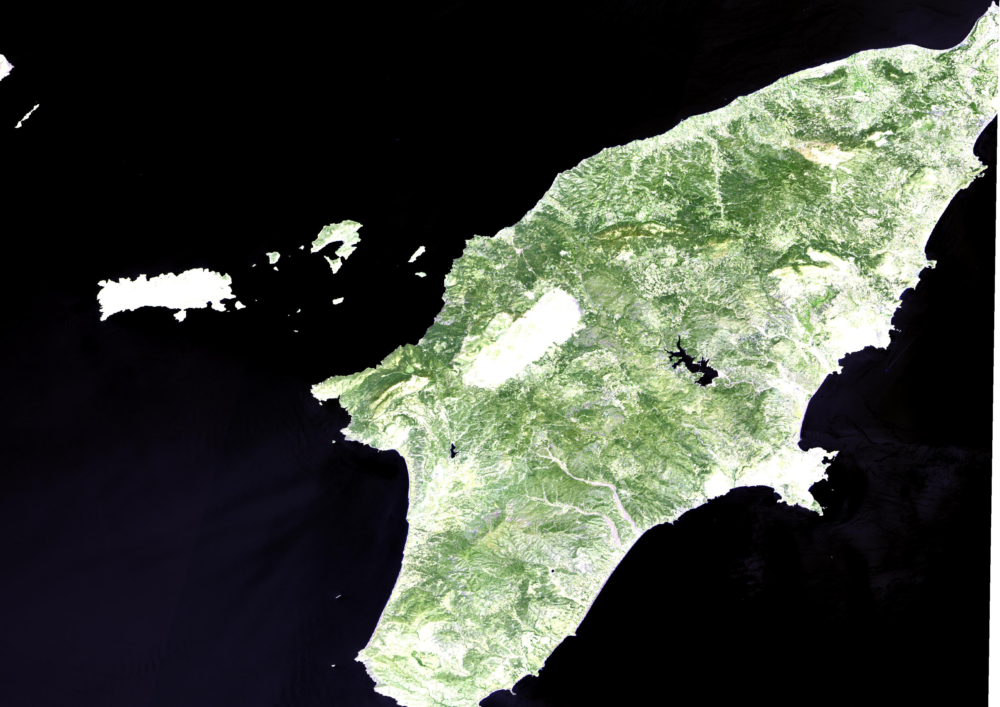
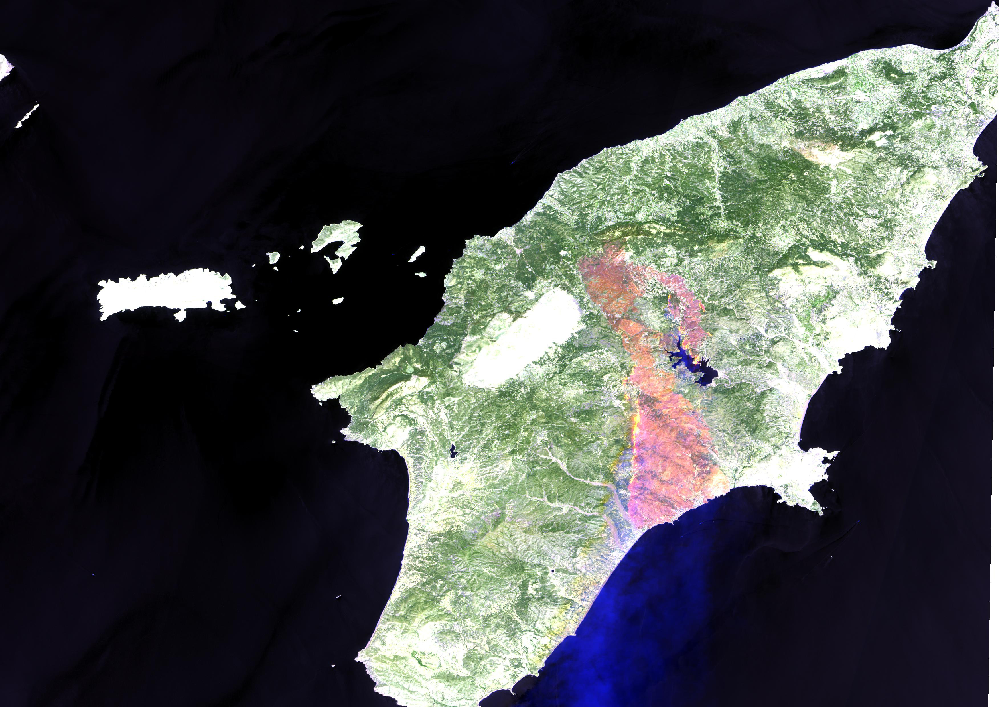

In [21]:
leafmap.image_comparison(
    img1,
    img2,
    label1='Pre fire',
    label2='Post fire',
    starting_position=50,
    out_html='image_comparison.html',
)

In [195]:
band2_path

'/home/sg/Projects/fires2023/rodos_smoke_34.871337_27.227918/S2B_MSIL1C_20230723T084609_N0509_R107_T35SNU_20230723T092729/S2B_MSIL1C_20230723T084609_N0509_R107_T35SNU_20230723T092729.SAFE/GRANULE/L1C_T35SNU_A033309_20230723T084944/IMG_DATA/T35SNU_20230723T084609_B02.jp2'

In [196]:
band_02=rasterio.open(band2_path)
band_03=rasterio.open(band3_path)
band_04=rasterio.open(band4_path)

In [197]:
red = band_04.read(1)
green = band_03.read(1)
blue = band_02.read(1)

In [198]:
def normalize(band):
    band_min, band_max = (band.min(), band.max())
    return ((band-band_min)/((band_max - band_min)))
def brighten(band):
    alpha=0.13
    beta=0
    return np.clip(alpha*band+beta, 0,255)

red_b=brighten(red)
blue_b=brighten(blue)
green_b=brighten(green)

red_bn = normalize(red_b)
green_bn = normalize(green_b)
blue_bn = normalize(blue_b)

In [199]:
rgb_composite_n= np.dstack((red, green, blue))

In [ ]:
plt.imshow(rgb_composite_n)

# Land_use_land_cover

In [2]:
from osgeo import gdal

In [3]:
shapefile = gpd.read_file('/home/sg/Downloads/7aa95a79f97e4dcc809afa72d6e93197/7aa95a79f97e4dcc809afa72d6e93197.shp')

In [4]:
shapefile = shapefile.to_crs(epsg=2100)

In [5]:
corine = gpd.read_file('/home/sg/Downloads/1cefc5e87d3cecf0f145fc4d0823668669f51423/u2018_clc2018_v2020_20u1_geoPackage/DATA/corine_greece.shp')

In [6]:
corine.crs

<Derived Projected CRS: EPSG:3035>
Name: ETRS89-extended / LAEA Europe
Axis Info [cartesian]:
- Y[north]: Northing (metre)
- X[east]: Easting (metre)
Area of Use:
- name: Europe - European Union (EU) countries and candidates. Europe - onshore and offshore: Albania; Andorra; Austria; Belgium; Bosnia and Herzegovina; Bulgaria; Croatia; Cyprus; Czechia; Denmark; Estonia; Faroe Islands; Finland; France; Germany; Gibraltar; Greece; Hungary; Iceland; Ireland; Italy; Kosovo; Latvia; Liechtenstein; Lithuania; Luxembourg; Malta; Monaco; Montenegro; Netherlands; North Macedonia; Norway including Svalbard and Jan Mayen; Poland; Portugal including Madeira and Azores; Romania; San Marino; Serbia; Slovakia; Slovenia; Spain including Canary Islands; Sweden; Switzerland; Türkiye (Turkey); United Kingdom (UK) including Channel Islands and Isle of Man; Vatican City State.
- bounds: (-35.58, 24.6, 44.83, 84.73)
Coordinate Operation:
- name: Europe Equal Area 2001
- method: Lambert Azimuthal Equal Area
Da

In [7]:
codes = pd.read_csv('/home/sg/Projects/FIrehub-model/no_fire_90/CLC_codes.csv')

In [8]:
nom = pd.read_csv('clc_nom.csv')

In [9]:
nom['id'] = nom.index+1

In [10]:
nom

,Class,Description,Hex Color,id
0,111,Continuous Urban Fabric,#800000,1
1,112,Discontinuous Urban Fabric,#b30000,2
2,121,Industrial or Commercial Units,#cc0000,3
3,122,Road and Rail Networks and Associated Land,#e60000,4
4,123,Port Areas,#ff0000,5
5,124,Airports,#ff1a1a,6
6,131,Mineral Extraction Sites,#ff4d4d,7
7,132,Dump Sites,#ff6666,8
8,133,Construction Sites,#ff8080,9
9,141,Green Urban Areas,#e6e600,10


In [11]:
corine = corine.to_crs(epsg=2100)

In [12]:
clipped_corine_gdf = gpd.clip(corine, shapefile)

In [13]:
clipped_corine_gdf

,OBJECTID,Code_18,Remark,Area_Ha,ID,geometry
28304,658480.0,321,NaN,1629.313861,EU_658480,"POLYGON ((541296.613 3900184.180, 541288.628 3..."
834,630671.0,112,NaN,1566.460344,EU_630671,"MULTIPOLYGON (((491474.932 4179781.397, 491492..."
33591,663770.0,323,NaN,480.351462,EU_663770,"MULTIPOLYGON (((491998.565 4180480.315, 491936..."
43736,673936.0,334,NaN,374.540308,EU_673936,"MULTIPOLYGON (((493973.786 4179975.536, 493999..."
33589,663768.0,323,NaN,121.682249,EU_663768,"POLYGON ((495413.986 4178934.715, 495419.956 4..."
...,...,...,...,...,...,...
30706,660882.0,321,NaN,62.746071,EU_660882,"POLYGON ((402990.638 4361237.810, 402916.648 4..."
7126,637147.0,222,NaN,33.648547,EU_637147,"POLYGON ((403506.091 4361334.374, 403500.413 4..."
35986,666165.0,323,NaN,32.458169,EU_666165,"POLYGON ((403150.446 4361445.156, 403134.041 4..."
20199,650350.0,243,NaN,107.840161,EU_650350,"POLYGON ((402683.364 4361420.884, 402687.329 4..."


In [14]:
nom['Class'] = nom['Class'].astype(str)
clipped_corine_gdf = clipped_corine_gdf.merge(nom, left_on='Code_18', right_on='Class')

In [15]:
clipped_corine_gdf = clipped_corine_gdf.assign(area=clipped_corine_gdf.area)

In [16]:
#clipped_corine_gdf.to_file('corine_clipped_loutraki')

In [17]:
corine_grouped = clipped_corine_gdf.groupby('Class')['area'].sum().reset_index()

In [18]:
corine_grouped['area'] = corine_grouped['area']/10000

In [19]:
corine_grouped = corine_grouped.merge(nom, left_on='Class', right_on='Class')

In [20]:
corine_grouped.columns

Index(['Class', 'area', ' Description', ' Hex Color', 'id'], dtype='object')

In [21]:
corine_grouped['percentage'] = corine_grouped.area.apply(lambda x: (x/corine_grouped.area.sum())*100)

In [175]:
corine_grouped

,Class,area,Description,Hex Color,id,percentage
0,243,1.360610,Olive Groves,#33cc33,17,0.111539
1,313,6.012533,Mixed Forest,#00e64d,21,0.492890
2,321,194.807110,Natural Grasslands,#99e699,22,15.969730
3,323,317.540525,Sclerophyllous Vegetation,#99ffcc,24,26.031064
4,333,700.131480,Sparsely Vegetated Areas,#9999cc,28,57.394777


In [176]:
#clipped_corine_gdf.to_file('/home/sg/Projects/fires2023/rodos_totals/lc_rodos')

In [177]:
clipped_corine_gdf[' Hex Color'] = clipped_corine_gdf[' Hex Color'].str.strip()

<AxesSubplot: >

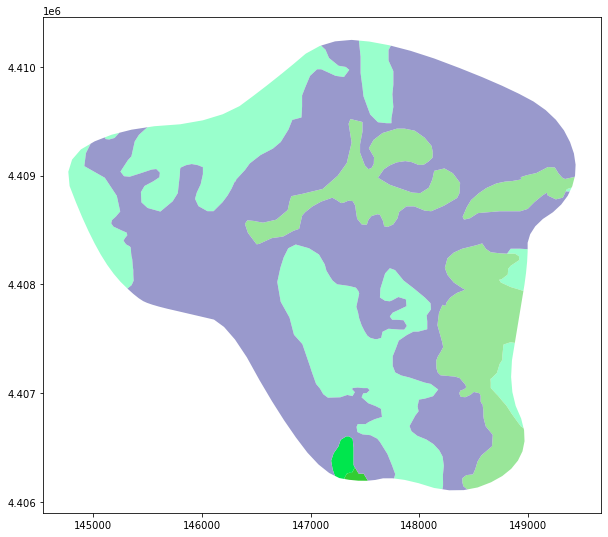

In [178]:
fig, ax = plt.subplots(figsize=(10, 10))

clipped_corine_gdf.plot(ax=ax, color=clipped_corine_gdf[' Hex Color'], legend=True)

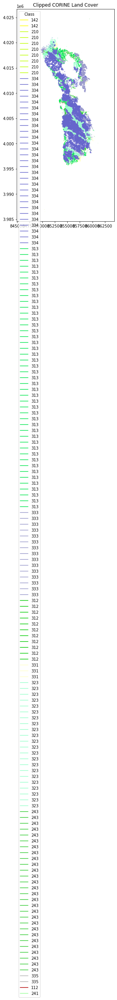

In [122]:
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the GeoDataFrame using colors from the 'Hex color' column
clipped_corine_gdf.plot(ax=ax, color=clipped_corine_gdf[' Hex Color'])

# Add a title to the plot
plt.title('Clipped CORINE Land Cover')

# Create a custom legend based on the 'Hex color' column
legend_handles = [plt.Line2D([], [], color=color, label=label) for color, label in zip(clipped_corine_gdf[' Hex Color'], clipped_corine_gdf['Class'])]

# Add the legend to the plot
plt.legend(handles=legend_handles, title='Class', loc='upper left')

# Show the plot
plt.show()